In [2]:
import matplotlib.pyplot as plt
import scanpy as sc
import numpy as np
import os

import bin2cell as b2c

In [3]:
os.makedirs("stardist", exist_ok=True)

In [9]:
path = "binned_outputs/square_002um"
# the image you used for --image of spaceranger, that's the one the spatial coordinates are based on
source_image_path = "H1-TXK6Z4X-A1_SK24-001_A1-4-003.tiff"
spaceranger_image_path = "spatial"

In [10]:
adata = b2c.read_visium(
    path,
    source_image_path=source_image_path,
    spaceranger_image_path=spaceranger_image_path,
)
adata.var_names_make_unique()
adata

anndata.py (1820): Variable names are not unique. To make them unique, call `.var_names_make_unique`.
anndata.py (1820): Variable names are not unique. To make them unique, call `.var_names_make_unique`.


AnnData object with n_obs × n_vars = 4919197 × 18085
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

In [11]:
sc.pp.filter_genes(adata, min_cells=3)
sc.pp.filter_cells(adata, min_counts=1)
adata

AnnData object with n_obs × n_vars = 3550646 × 17079
    obs: 'in_tissue', 'array_row', 'array_col', 'n_counts'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells'
    uns: 'spatial'
    obsm: 'spatial'

In [12]:
mpp = 0.3

b2c.scaled_he_image(adata, mpp=mpp, save_path="stardist/he.tiff")

Cropped spatial coordinates key: spatial_cropped_150_buffer
Image key: 0.3_mpp_150_buffer


In [13]:
b2c.destripe(adata)

_construct.py (149): Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


anndata.py (1209): Trying to modify attribute `.var` of view, initializing view as actual.
anndata.py (1209): Trying to modify attribute `.var` of view, initializing view as actual.


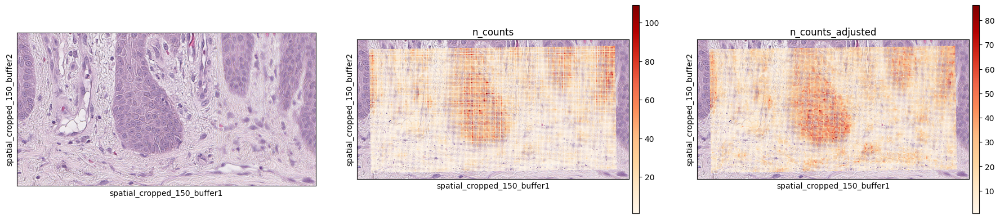

In [15]:
mask = (
    (adata.obs["array_row"] >= 1450)
    & (adata.obs["array_row"] <= 1550)
    & (adata.obs["array_col"] >= 250)
    & (adata.obs["array_col"] <= 450)
)

bdata = adata[mask]
sc.pl.spatial(
    bdata,
    color=[None, "n_counts", "n_counts_adjusted"],
    color_map="OrRd",
    img_key="0.3_mpp_150_buffer",
    basis="spatial_cropped_150_buffer",
)

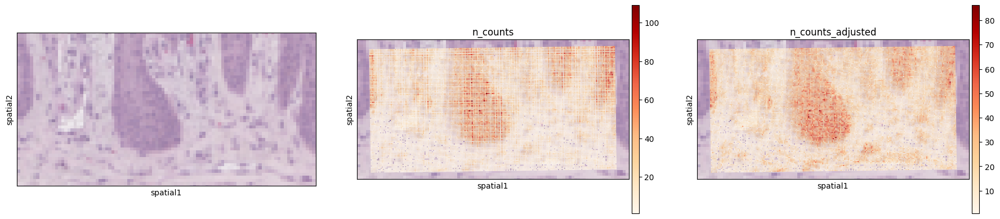

In [16]:
sc.pl.spatial(bdata, color=[None, "n_counts", "n_counts_adjusted"], color_map="OrRd")

In [19]:
b2c.stardist(
    image_path="stardist/he.tiff",
    labels_npz_path="stardist/he.npz",
    stardist_model="2D_versatile_he",
    prob_thresh=0.01,
)

Found model '2D_versatile_he' for 'StarDist2D'.
5294730/5294730 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.692478, nms_thresh=0.3.
effective: block_size=(4096, 4096, 3), min_overlap=(128, 128, 0), context=(128, 128, 0)


functional.py (237): The structure of `inputs` doesn't match the expected structure.
Expected: ['input']
Received: inputs=Tensor(shape=(1, 256, 256, 3))
  0%|          | 0/42 [00:00<?, ?it/s]functional.py (237): The structure of `inputs` doesn't match the expected structure.
Expected: ['input']
Received: inputs=Tensor(shape=(1, None, None, 3))
100%|██████████| 42/42 [07:34<00:00, 10.83s/it]


Found 180625 objects


In [20]:
b2c.insert_labels(
    adata,
    labels_npz_path="stardist/he.npz",
    basis="spatial",
    spatial_key="spatial_cropped_150_buffer",
    mpp=mpp,
    labels_key="labels_he",
)

3541263423.py (5): Trying to modify attribute `.obs` of view, initializing view as actual.


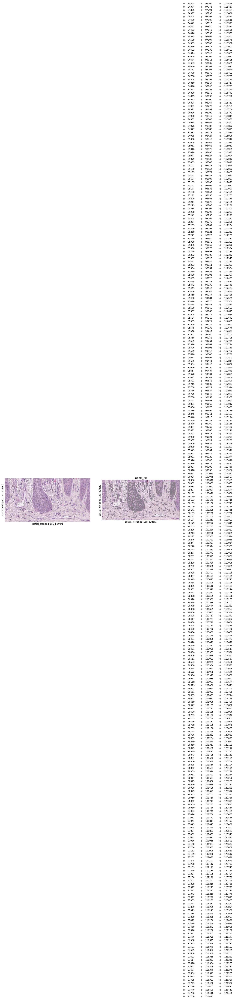

In [25]:
bdata = adata[mask]

# the labels obs are integers, 0 means unassigned
bdata = bdata[bdata.obs["labels_he"] > 0]
bdata.obs["labels_he"] = bdata.obs["labels_he"].astype(str)

sc.pl.spatial(
    bdata,
    color=[None, "labels_he"],
    img_key="0.3_mpp_150_buffer",
    basis="spatial_cropped_150_buffer",
)

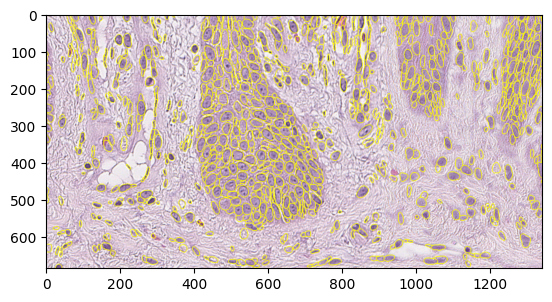

In [27]:
# the label viewer wants a crop of the processed image
# get the corresponding coordinates spanning the subset object
crop = b2c.get_crop(
    bdata, basis="spatial", spatial_key="spatial_cropped_150_buffer", mpp=mpp
)

rendered = b2c.view_labels(
    image_path="stardist/he.tiff", labels_npz_path="stardist/he.npz", crop=crop
)
plt.imshow(rendered)

In [28]:
b2c.expand_labels(
    adata, labels_key="labels_he", expanded_labels_key="labels_he_expanded"
)

2208659422.py (5): Trying to modify attribute `.obs` of view, initializing view as actual.


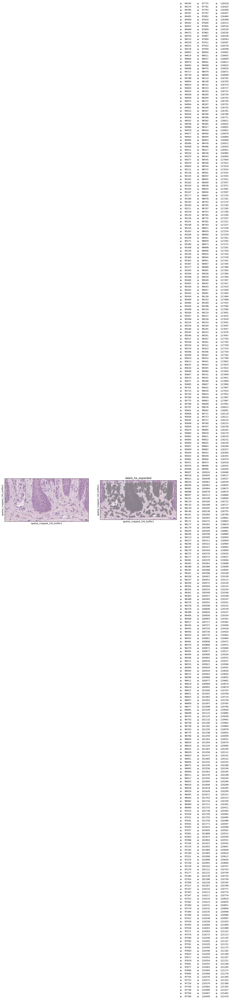

In [29]:
bdata = adata[mask]

# the labels obs are integers, 0 means unassigned
bdata = bdata[bdata.obs["labels_he_expanded"] > 0]
bdata.obs["labels_he_expanded"] = bdata.obs["labels_he_expanded"].astype(str)

sc.pl.spatial(
    bdata,
    color=[None, "labels_he_expanded"],
    img_key="0.3_mpp_150_buffer",
    basis="spatial_cropped_150_buffer",
)

In [30]:
b2c.grid_image(
    adata, "n_counts_adjusted", mpp=mpp, sigma=5, save_path="stardist/gex.tiff"
)

In [31]:
b2c.stardist(
    image_path="stardist/gex.tiff",
    labels_npz_path="stardist/gex.npz",
    stardist_model="2D_versatile_fluo",
    prob_thresh=0.05,
    nms_thresh=0.5,
)

Found model '2D_versatile_fluo' for 'StarDist2D'.
5320433/5320433 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.
effective: block_size=(4096, 4096), min_overlap=(128, 128), context=(128, 128)


functional.py (237): The structure of `inputs` doesn't match the expected structure.
Expected: ['input']
Received: inputs=Tensor(shape=(1, 256, 256, 1))
  0%|          | 0/36 [00:00<?, ?it/s]functional.py (237): The structure of `inputs` doesn't match the expected structure.
Expected: ['input']
Received: inputs=Tensor(shape=(1, None, None, 1))
100%|██████████| 36/36 [09:24<00:00, 15.68s/it]


Found 203948 objects


In [32]:
b2c.insert_labels(
    adata,
    labels_npz_path="stardist/gex.npz",
    basis="array",
    mpp=mpp,
    labels_key="labels_gex",
)

3087949908.py (5): Trying to modify attribute `.obs` of view, initializing view as actual.


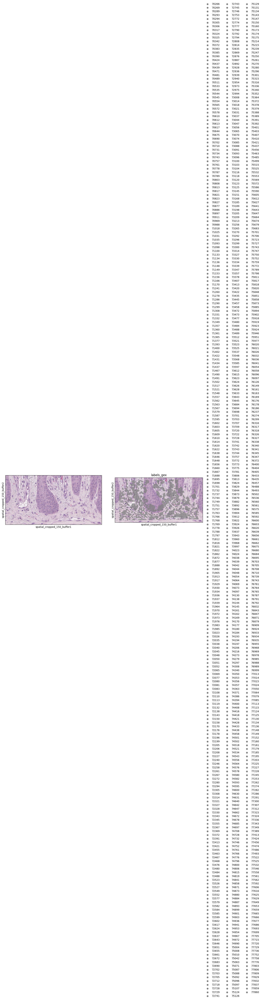

In [33]:
bdata = adata[mask]

# the labels obs are integers, 0 means unassigned
bdata = bdata[bdata.obs["labels_gex"] > 0]
bdata.obs["labels_gex"] = bdata.obs["labels_gex"].astype(str)

sc.pl.spatial(
    bdata,
    color=[None, "labels_gex"],
    img_key="0.3_mpp_150_buffer",
    basis="spatial_cropped_150_buffer",
)

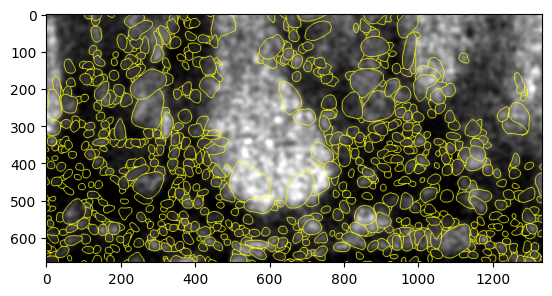

In [34]:
# the label viewer wants a crop of the processed image
# get the corresponding coordinates spanning the subset object
crop = b2c.get_crop(bdata, basis="array", mpp=mpp)

# GEX pops better with percentile normalisation performed
rendered = b2c.view_labels(
    image_path="stardist/gex.tiff",
    labels_npz_path="stardist/gex.npz",
    crop=crop,
    stardist_normalize=True,
)
plt.imshow(rendered)

In [35]:
b2c.salvage_secondary_labels(
    adata,
    primary_label="labels_he_expanded",
    secondary_label="labels_gex",
    labels_key="labels_joint",
)

Salvaged 83445 secondary labels


406240527.py (5): Trying to modify attribute `.obs` of view, initializing view as actual.


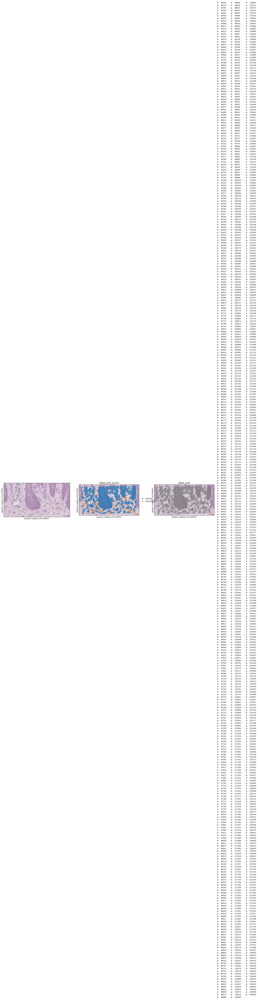

In [37]:
bdata = adata[mask]

# the labels obs are integers, 0 means unassigned
bdata = bdata[bdata.obs["labels_joint"] > 0]
bdata.obs["labels_joint"] = bdata.obs["labels_joint"].astype(str)

sc.pl.spatial(
    bdata,
    color=[None, "labels_joint_source", "labels_joint"],
    img_key="0.3_mpp_150_buffer",
    basis="spatial_cropped_150_buffer",
)

In [38]:
cdata = b2c.bin_to_cell(adata, labels_key="labels_joint", spatial_keys=["spatial", "spatial_cropped_150_buffer"])

anndata.py (1209): Trying to modify attribute `.obs` of view, initializing view as actual.
anndata.py (1209): Trying to modify attribute `.var` of view, initializing view as actual.
anndata.py (1209): Trying to modify attribute `.var` of view, initializing view as actual.


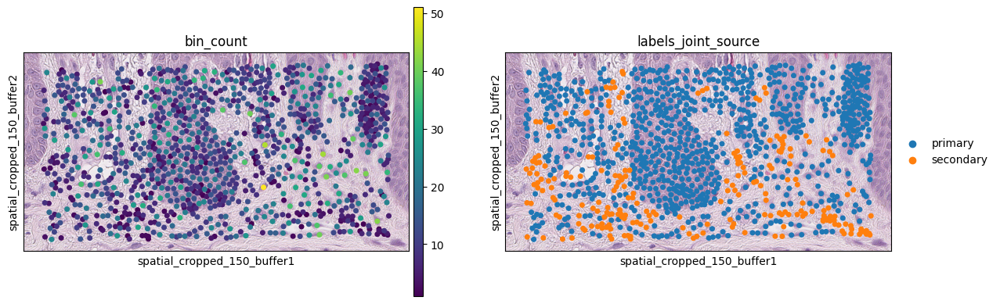

In [39]:
cell_mask = (
    (cdata.obs["array_row"] >= 1450)
    & (cdata.obs["array_row"] <= 1550)
    & (cdata.obs["array_col"] >= 250)
    & (cdata.obs["array_col"] <= 450)
)

ddata = cdata[cell_mask]
sc.pl.spatial(
    ddata,
    color=["bin_count", "labels_joint_source"],
    img_key="0.3_mpp_150_buffer",
    basis="spatial_cropped_150_buffer",
)

In [40]:
cdata.write_h5ad('skin_b2c.h5ad')
adata.write_h5ad('skin_2um.h5ad')

In [42]:
cdata = sc.read_h5ad('skin_b2c.h5ad')
cdata

AnnData object with n_obs × n_vars = 219200 × 17079
    obs: 'object_id', 'bin_count', 'array_row', 'array_col', 'labels_joint_source'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells'
    uns: 'spatial'
    obsm: 'spatial', 'spatial_cropped_150_buffer'